In [19]:
from IPython.display import HTML, Image, YouTubeVideo

# MSDS688 -- Artificial Intelligence

## Week 8 - Wrapping up

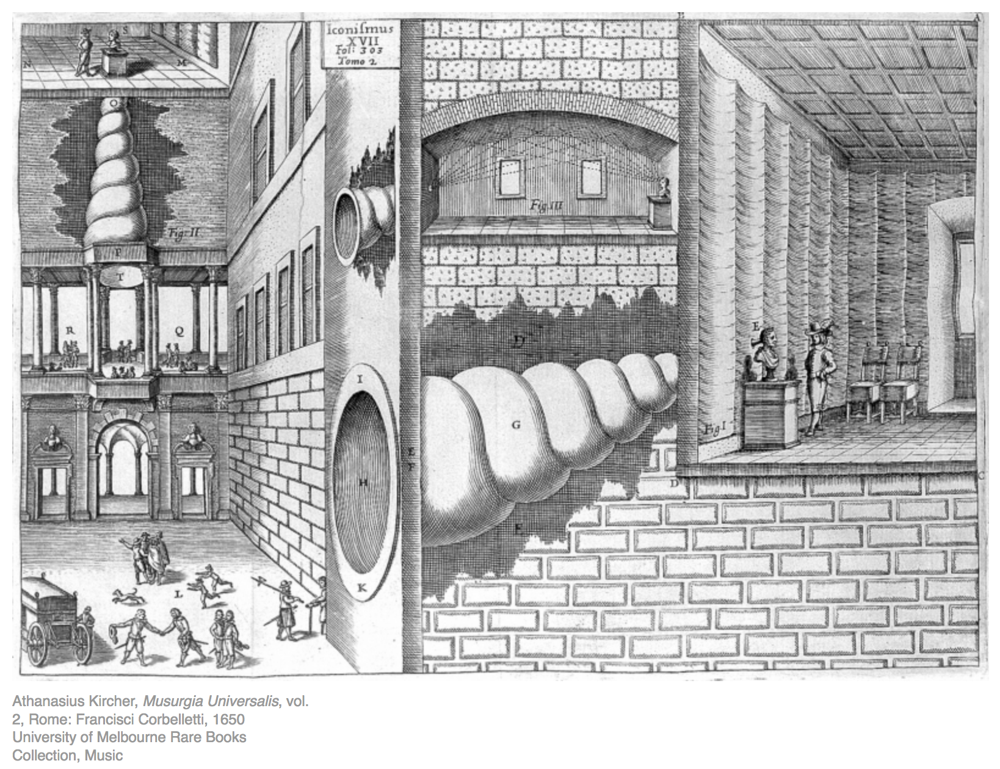

In [20]:
Image('images/eavesdropping.png')

Eavesdropping is a unique collaboration between Liquid Architecture, Melbourne Law School and the Ian Potter Museum of Art, comprising gram, series of working groups and touring event which explores the politics of listening through work by leading artists, researchers, writers and activists from Australia and around the world.

# Review

## What is artificial intellegence?

### Let's use acting rationally as framework to view the topic

* Acting to achieve a goal using knowledge of the world

* Able to deal with uncertainty when logical reasoning fails

* Hypothesis testing is well supported

* Modern AI resides here!

### What are the qualities of an AI's world?

* _Fully or partially observable_ --> Is entire state of the world knowable?

* _Deterministic vs Stochastic_ --> Is the world uncertain?

* _Episodic vs sequential_ --> Do previous actions matter?

* _Static vs dynamic_ --> Do changes occur while picking action?

* _Discrete vs continuous_ --> Finite or infinite possibilities?

* _Known vs unknown_ --> Are the rules known? 

* _Adversarial or Cooperative_ --> Competitive, cooperative or a mix?

## How can problems be specified?

* __Initial state__ - The state where the agent begins its search

* __Path cost__ - Expresses the expense of reaching the current state 

* __Transition model__ - What state will result for each possible action

* __Goal test__ - Is the current state a goal?  Are we there yet?

* _Key: Abstract the problem to the essential elements needed, and remove all others_

## What constitutes a solution?

* Solution
    - __Path__ is a sequence of nodes from the start to the goal
    - __Cost__ the length of the path measured in nodes or edge distance

## How can we find solutions?

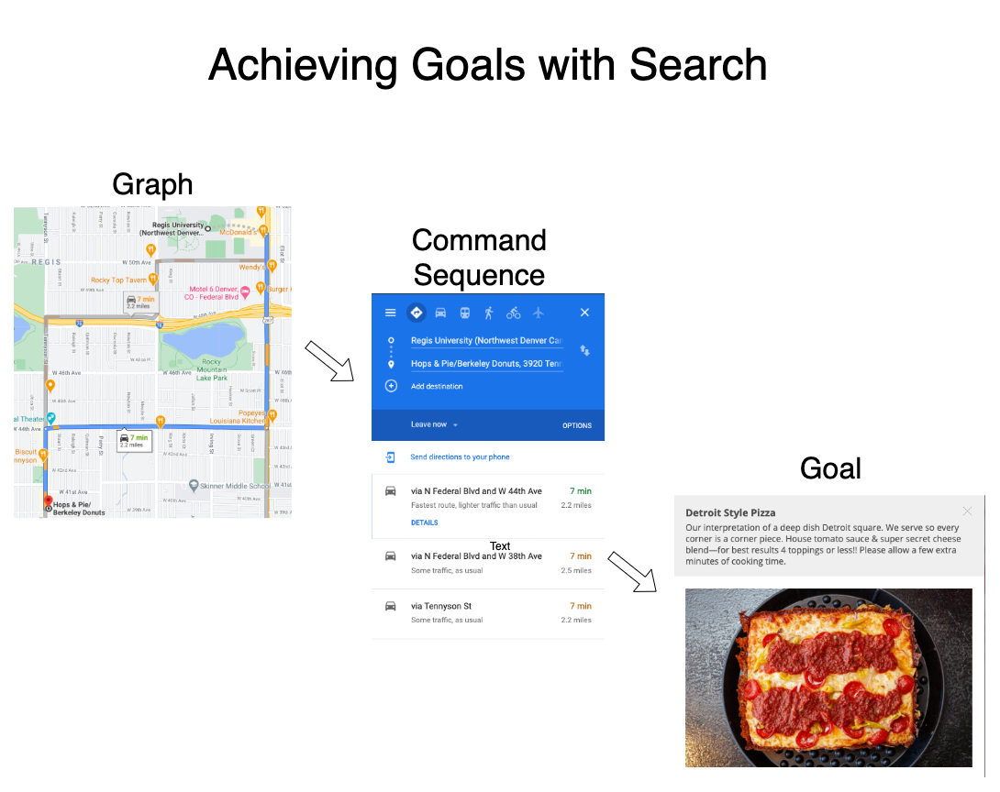

In [21]:
Image('./images/achieve-goals-search.png')

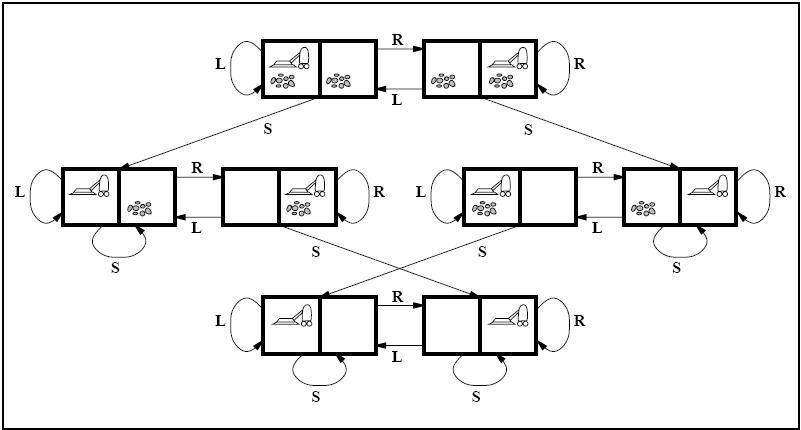

In [22]:
Image('images/simple_problem_solving_agent.jpg')

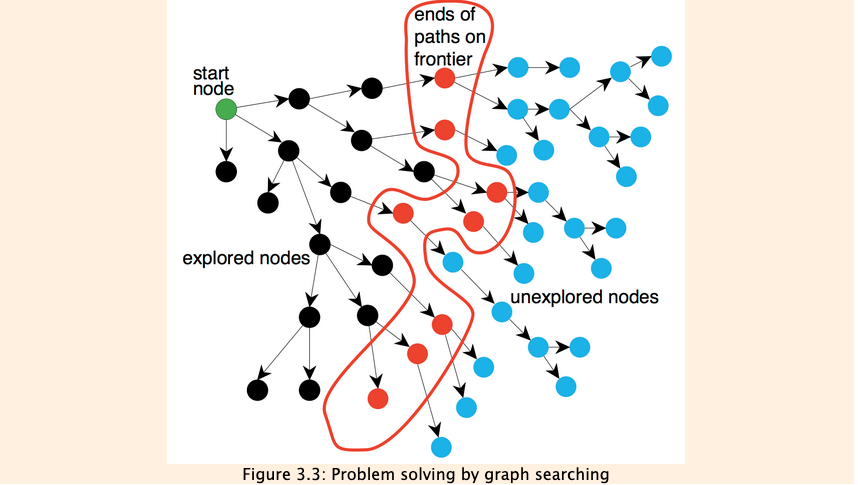

In [23]:
Image('./images/explored-frontier-unexplored-tree.png')

## How large are search spaces?

* The number of possibles states in a task environment is surprisingly large

* For chess, roughly 10^120

* **That is more than all the atoms in the universe**

* Effectively infinite

## What algorithm should we use?

__function__ BEST-FIRST-SEARCH(_problem_) __returns__ a solution, or failure 

&emsp;_node_ &larr; a node with STATE = _problem_.INITIAL\-STATE, PATH\-COST = 0  
&emsp;_frontier_ &larr; a priority queue ordered by PATH\-COST, with _node_ as the only element  
&emsp;_explored_ &larr; an empty set 

&emsp;__loop do__  

&emsp;&emsp;&emsp;__if__ EMPTY?(_frontier_) __then return__ failure

&emsp;&emsp;&emsp;_node_ &larr; POP(_frontier_) /\* chooses the lowest\-cost node in _frontier_ \*/

&emsp;&emsp;&emsp;__if__ _problem_.GOAL\-TEST(_node_.STATE) __then return__ SOLUTION(_node_)

&emsp;&emsp;&emsp;add _node_.STATE to _explored_ 

&emsp;&emsp;&emsp;__for each__ _action_ __in__ _problem_.ACTIONS(_node_.STATE) __do__  

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;_child_ &larr; CHILD\-NODE(_problem_,_node_,_action_) 

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;__if__ _child_.STATE is not in _explored_ or _frontier_ __then__  

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;_frontier_ &larr; INSERT(_child_,_frontier_)

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;__else if__ _child_.STATE is in _frontier_ with higher PATH\-COST 
__then__  
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;replace that _frontier_ node with _child_  

---


---

## Can we use search to help us compete?

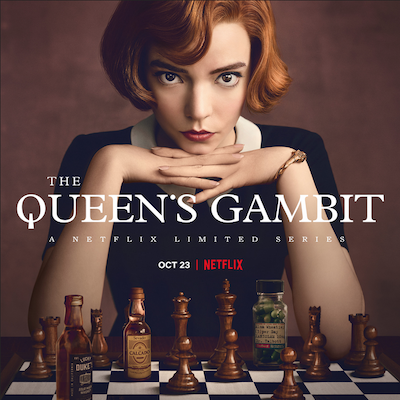

In [24]:
# Source: Netflix, 2020.  

Image('./images/queens-gambit-netflix.png')

## Concept: Minimax algorithm

* Imagine a two-player game

* MAX --> Always wants the HIGHEST score possible

* MIN --> Always wants the LOWEST score possible

* They take turns limiting each other the worst possible moves available

* the more a player can anticipate the better

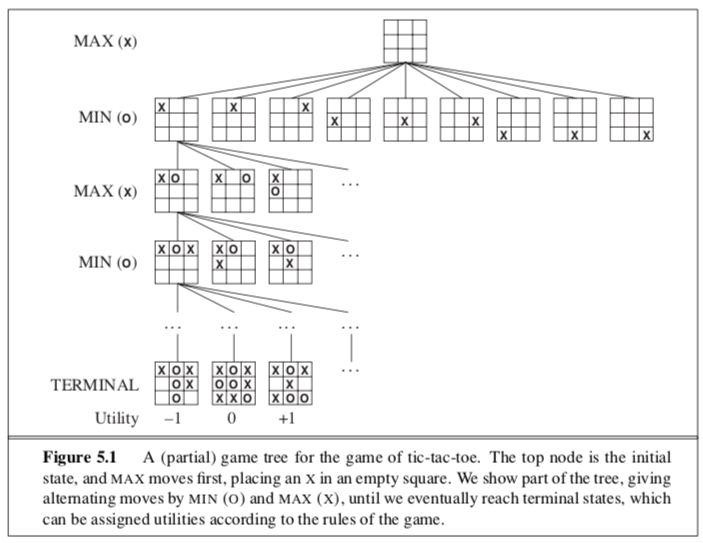

In [25]:
i = Image('images/Figure-S5-1-minmax-example.png')
i

## How can we do that?

# MiniMax algorithm

__function__ MINIMAX-DECISION(_state_) __returns__ _an action_  
&emsp;__return__ arg max<sub> _a_ &Element; ACTIONS(_s_)</sub> MIN\-VALUE(RESULT(_state_, _a_))  

---
__function__ MAX\-VALUE(_state_) __returns__ _a utility value_  
&emsp;__if__ TERMINAL\-TEST(_state_) __then return__ UTILITY(_state_)

&emsp;_v_ &larr; &minus;&infin;  
&emsp;__for each__ _a_ __in__ ACTIONS(_state_) __do__  
&emsp;&emsp;&emsp;_v_ &larr; MAX(_v_, MIN\-VALUE(RESULT(_state_, _a_)))  
&emsp;__return__ _v_  

---
__function__ MIN\-VALUE(_state_) __returns__ _a utility value_  
&emsp;__if__ TERMINAL\-TEST(_state_) __then return__ UTILITY(_state_)

&emsp;_v_ &larr; &infin;  
&emsp;__for each__ _a_ __in__ ACTIONS(_state_) __do__  
&emsp;&emsp;&emsp;_v_ &larr; MIN(_v_, MAX\-VALUE(RESULT(_state_, _a_)))  
&emsp;__return__ _v_  

---


## Can do better?

##  By pruning branches that result in lower scores using Alpha-Beta

__function__ ALPHA-BETA-SEARCH(_state_) __returns__ an action  
&emsp;_v_ &larr; MAX\-VALUE(_state_, &minus;&infin;, &plus;&infin;)  
&emsp;__return__ the _action_ in ACTIONS(_state_) with value _v_  

---
__function__ MAX\-VALUE(_state_, _&alpha;_, _&beta;_) __returns__ _a utility value_  
&emsp;__if__ TERMINAL\-TEST(_state_) __then return__ UTILITY(_state_)

&emsp;_v_ &larr; &minus;&infin;  
&emsp;__for each__ _a_ __in__ ACTIONS(_state_) __do__  
&emsp;&emsp;&emsp;_v_ &larr; MAX(_v_, MIN\-VALUE(RESULT(_state_, _a_), _&alpha;_, _&beta;_))  
&emsp;&emsp;&emsp;__if__ _v_ &ge; _&beta;_ __then return__ _v_  
&emsp;&emsp;&emsp;_&alpha;_ &larr; MAX(_&alpha;_, _v_)  
&emsp;__return__ _v_  

---
__function__ MIN\-VALUE(_state_, _&alpha;_, _&beta;_) __returns__ _a utility value_  
&emsp;__if__ TERMINAL\-TEST(_state_) __then return__ UTILITY(_state_)

&emsp;_v_ &larr; &plus;&infin;  
&emsp;__for each__ _a_ __in__ ACTIONS(_state_) __do__  
&emsp;&emsp;&emsp;_v_ &larr; MIN(_v_, MAX\-VALUE(RESULT(_state_, _a_), _&alpha;_, _&beta;_))  
&emsp;&emsp;&emsp;__if__ _v_ &le; _&alpha;_ __then return__ _v_  
&emsp;&emsp;&emsp;_&beta;_ &larr; MIN(_&beta;_, _v_)  
&emsp;__return__ _v_  


## What effect does it have?

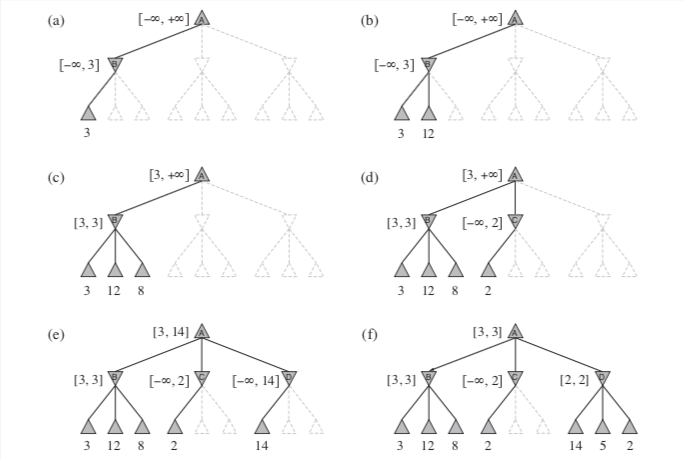

In [26]:
Image('images/Figure-S5-5-alphpabeta-pruning-example.png')

## Alpha-Beta Pruning

- Makes Minimax more efficient

- Allows for deeper search 

- Resulting in better moves being selected

- Sensitive to order of evaluation

---

# How can we reduce the number of possible states?

# What is a constraint satisfaction problem?

* General problem solving technique

* Set of _variables_ that can take on values

* Set of _values_ each variable can assume

* Constraints limit values of _local_ variables can assume

* Solutions must satisfy all constraints (_equal_, _not_equal_, ...)

* __Resulting in a radical reduction in the size of the search space__

## Example: Maps

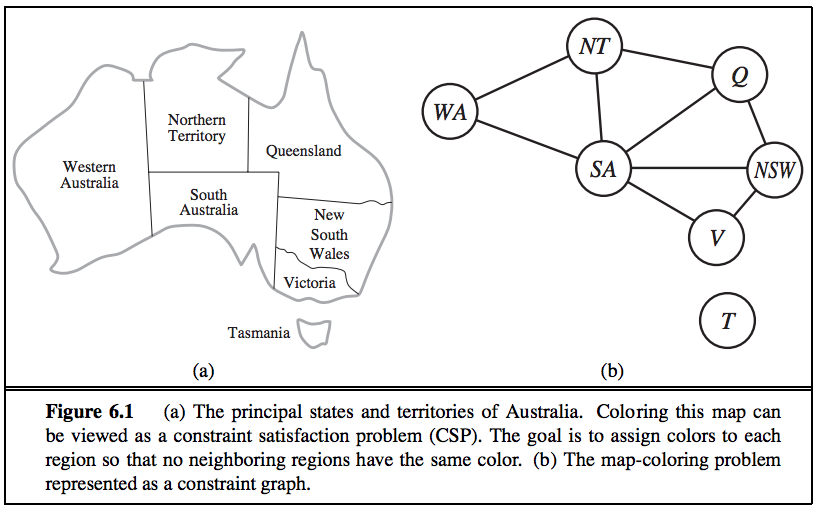

In [27]:
Image('images/Figure-S6-1-graph-coloring.png')

# Limiting choices

* CSP
    - Variables:   Q, NSW, V, T, SA, NT, WA
    - Domains:     {Green, Yellow, Purple}
    - Constraints: No adjacent territory can be the same color
    
 

## Solution

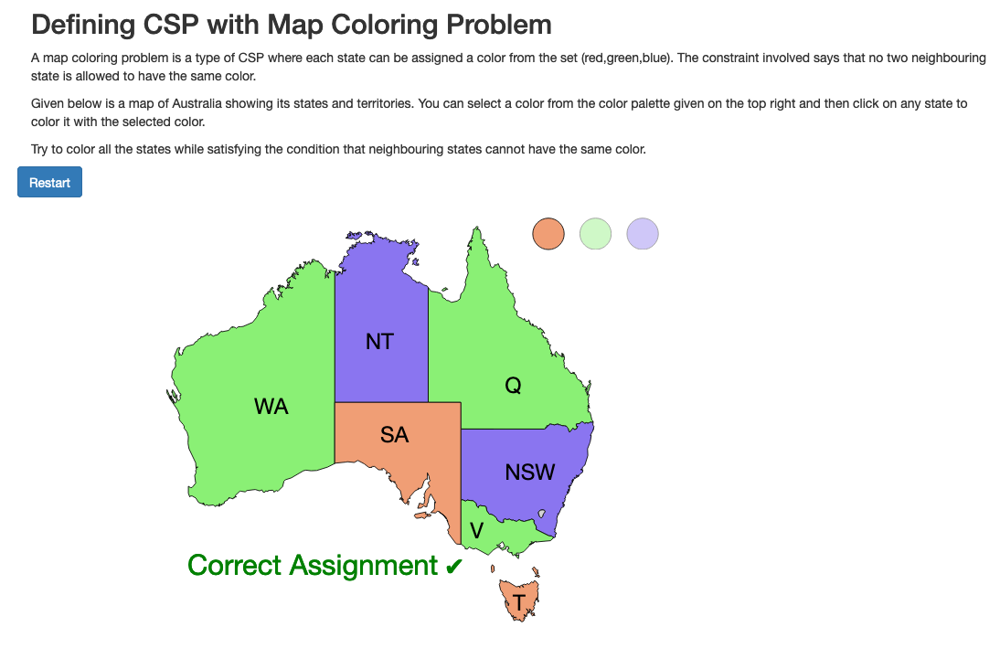

In [28]:
Image('images/map-coloring-solution.png')

## Example: Scheduling

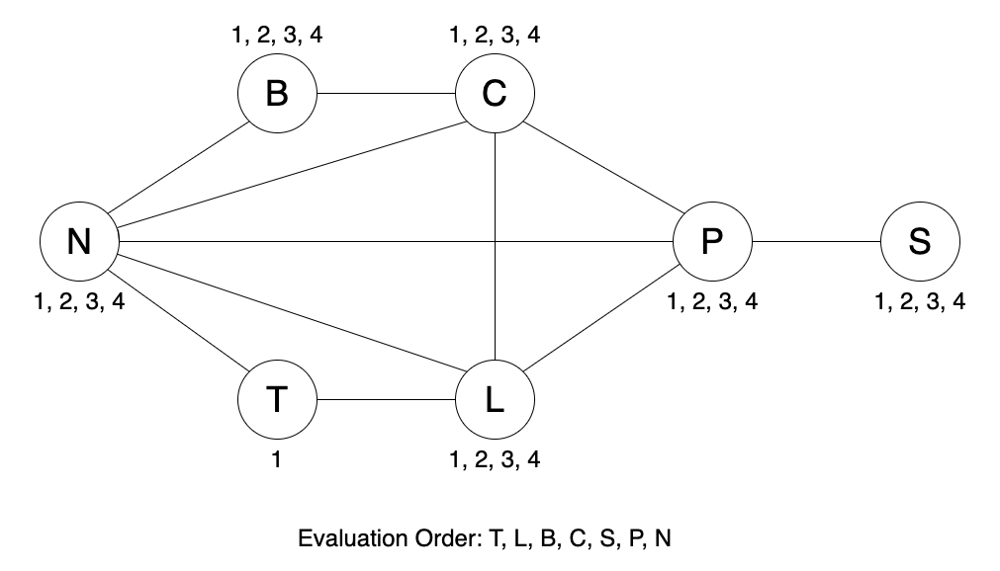

In [29]:
Image('./images/time-travelers-convention_order_for_slides.png')

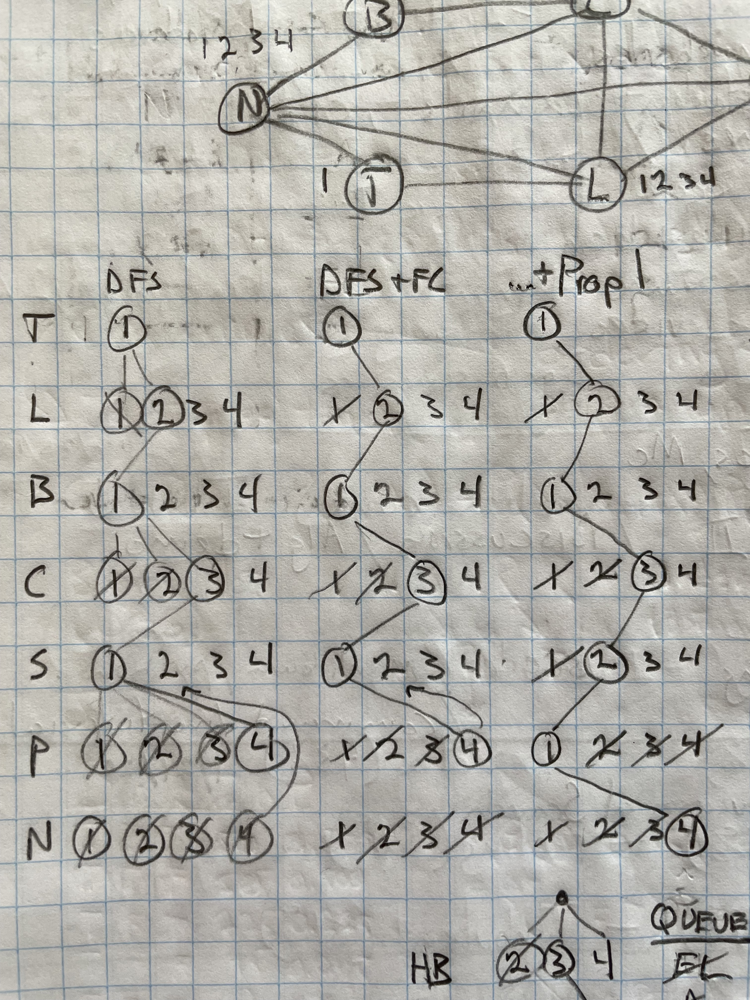

In [30]:
Image('./images/csp_scheduling_solution.jpg')

# BACKTRACKING-SEARCH (DFS)

## Idea: Search the entire space

__function__ BACKTRACKING-SEARCH(_csp_) __returns__ a solution, or failure  
&emsp;__return__ BACKTRACK(\{\}, _csp_)  

__function__ BACKTRACK(_assignment_, _csp_) __returns__ a solution, or failure  
&emsp;__if__ _assignment_ is complete __then return__ _assignment_  
&emsp;_var_ &larr; SELECT\-UNASSIGNED-VARIABLE(_csp_)

&emsp;__for each__ _value_ __in__ ORDER\-DOMAIN\-VALUES(_var_, _assignment_, _csp_) __do__  
&emsp;&emsp;&emsp;__if__ _value_ is consistent with _assignment_ __then__  
&emsp;&emsp;&emsp;&emsp;&emsp;add \{_var_ = _value_\} to _assignment_  
&emsp;&emsp;&emsp;&emsp;&emsp;_inferences_ &larr; INFERENCE(_csp_, _var_, _value_)

&emsp;&emsp;&emsp;&emsp;&emsp;__if__ _inferences_ &ne; _failure_ __then__  
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;add _inferences_ to _assignment_  
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;_result_ &larr; BACKTRACK(_assignment_, _csp_) 

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;__if__ _result_ &ne; _failure_ __then__  
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;__return__ _result_  
&emsp;&emsp;&emsp;&emsp;&emsp;remove \{_var_ = _value_\} and _inferences_ from _assignment_  
&emsp;__return__ _failure_

---

# Pre-Processing

__Idea: Eliminate conflicting domain values _before_ search__

## AC-3 Algorithm

__function__ AC-3(_csp_) __returns__ false if an inconsistency is found and true otherwise 

&emsp;__inputs__: _csp_, a binary CSP with components (_X_, _D_, _C_) 

&emsp;__local variables__: _queue_, a queue of arcs, initially all the arcs in _csp_  

&emsp;__while__ _queue_ is not empty __do__  
&emsp;&emsp;&emsp;(_X<sub>i</sub>_, _X<sub>j</sub>_) &larr; REMOVE\-FIRST(_queue_) 

&emsp;&emsp;&emsp;__if__ REVISE(_csp_, _X<sub>i</sub>_, _X<sub>j</sub>_) __then__  
&emsp;&emsp;&emsp;&emsp;&emsp;__if__ size of _D<sub>i</sub>_ = 0 __then return__ _false_  
&emsp;&emsp;&emsp;&emsp;&emsp;__for each__ _X<sub>k</sub>_ in _X<sub>i</sub>_.NEIGHBORS &minus; \{_X<sub>j</sub>_\} __do__  
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;add(_X<sub>k</sub>_, _X<sub>i</sub>_) to _queue_  
&emsp;__return__ _true_

---

__function__ REVISE(_csp_, _X<sub>i</sub>_, _X<sub>j</sub>_) __returns__ true iff we revise the domain of _X<sub>i</sub>_  
&emsp;_revised_ &larr; _false_  
&emsp;__for each__ _x_ __in__ _D<sub>i</sub>_ __do__  
&emsp;&emsp;&emsp;__if__ no value _y_ in _D<sub>j</sub>_ allows (_x_, _y_) to satisfy the constraint between  _X<sub>i</sub>_ and _X<sub>j</sub>_ __then__  
&emsp;&emsp;&emsp;&emsp;delete _x_ from _D<sub>i</sub>_  
&emsp;&emsp;&emsp;&emsp;_revised_ &larr; _true_  
&emsp;__return__ _revised_  

---

## Can we model the real world?

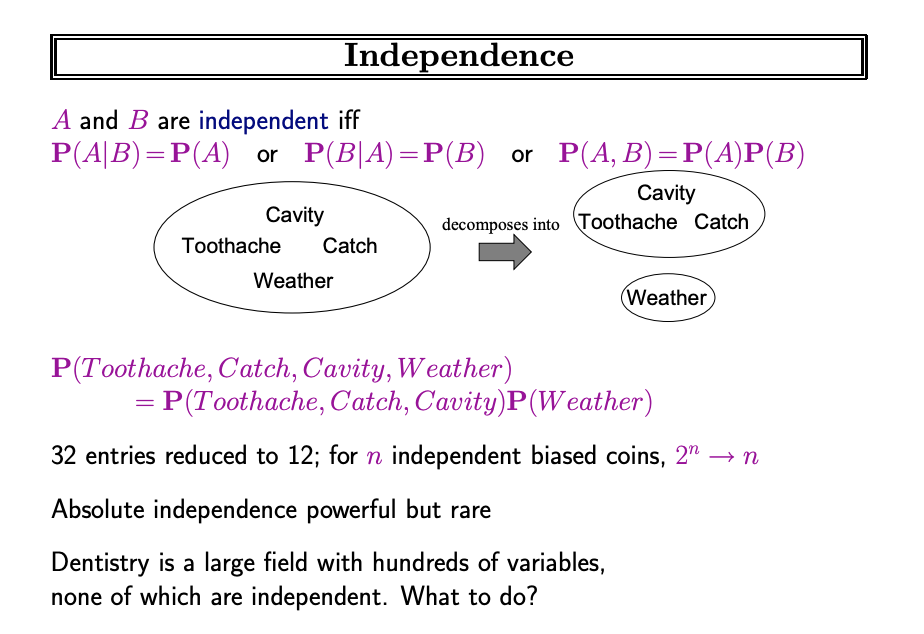

In [31]:
Image('images/prob-independence.png')

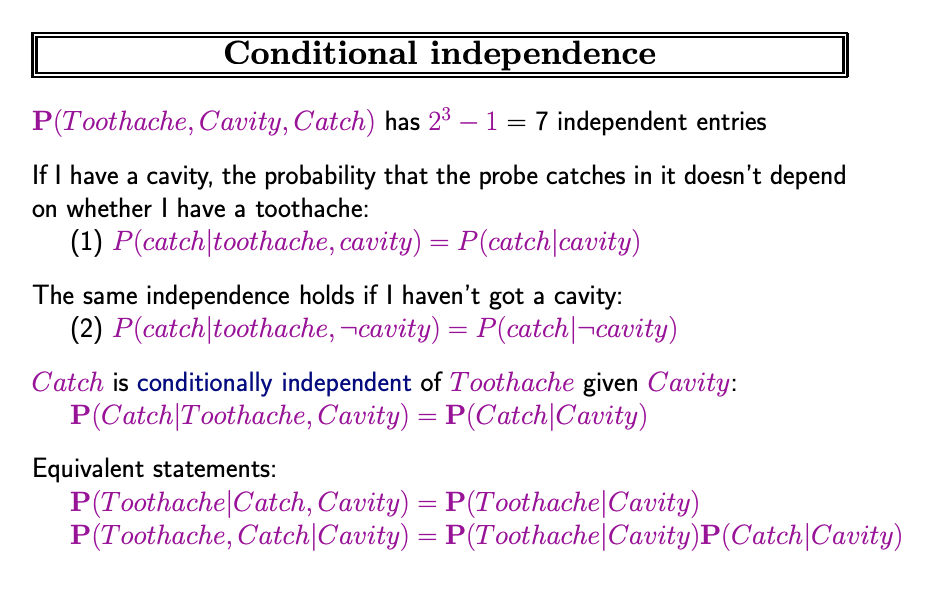

In [32]:
Image('images/prob-conditional-independence.png')

##  What is a Bayesian belief network?

* Combination of probability and graph theory

* Nodes are random variables with probability values

* Edges are conditional dependencies and model causality

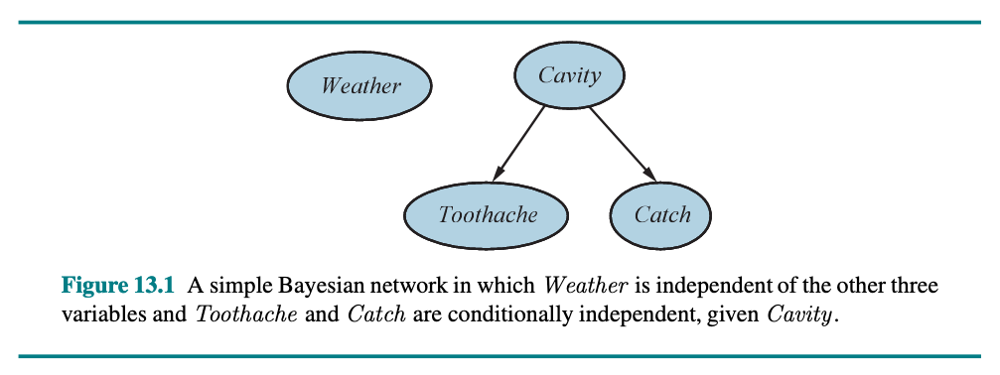

In [33]:
Image('images/bayes-net-toothache-model.png')

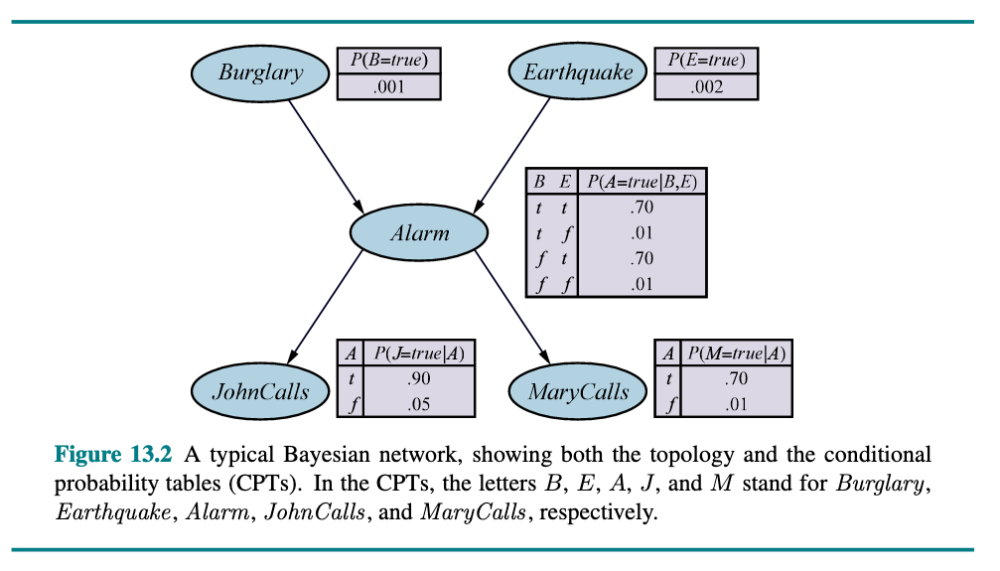

In [34]:
Image('images/Figure-S14-2-bayesian-belief-net.png')

## Networks are of our own design

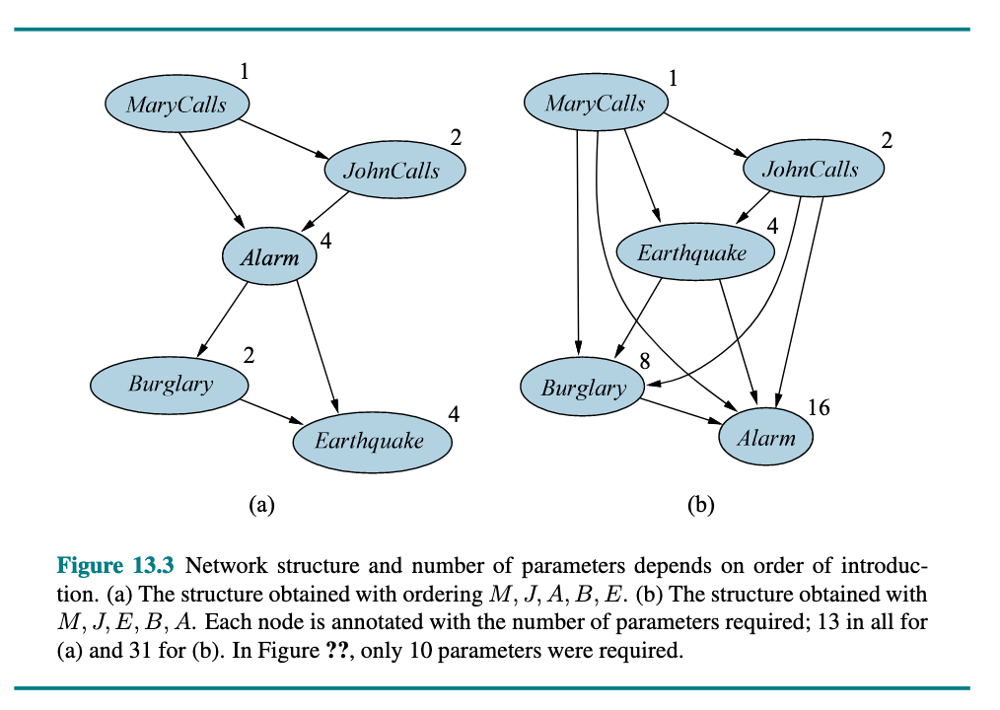

In [35]:
Image('images/bayes-net-competing-models.png')

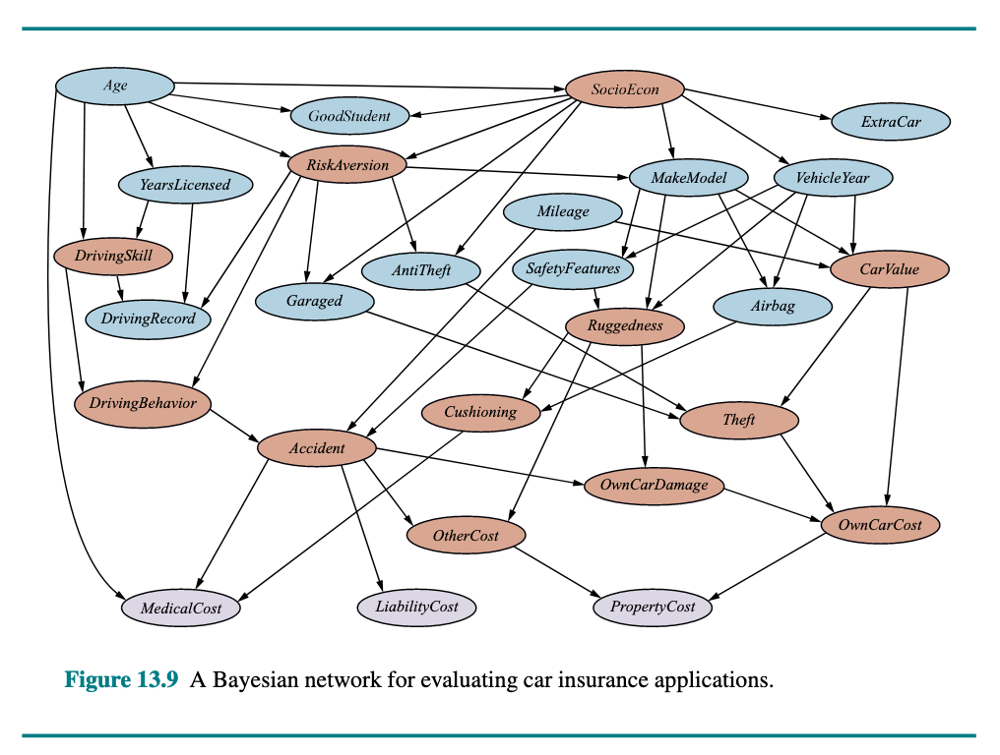

In [36]:
Image('images/bayes-net-car-insurance.png')

# Citations

* Russell, S. J., & Norvig, P. (2010). Artificial intelligence: A modern approach (3rd ed ed.). Upper Saddle River: Prentice-Hall. Note: Used text PDF, solutions manual, and books web resources that are available at http://aima.eecs.berkeley.edu/3rd-ed/.

* Chapter 2 - Intelligent Agents. (n.d.). Retrieved February 11, 2020, from Artificial Intelligence: A Modern Approach (3rd ed)](http://aima.cs.berkeley.edu/3rd-ed/)

* Chapter 3 - Solving Problems by Searching. (n.d.). Retrieved February 11, 2020, from [Artificial Intelligence: A Modern Approach (3rd ed)](http://aima.cs.berkeley.edu/3rd-ed/)

* Chapter 5 - Adversarial Search. (n.d.). Retrieved February 11, 2020, from [Artificial Intelligence: A Modern Approach (3rd ed)](http://aima.cs.berkeley.edu/3rd-ed/)

* Chapter 6 - Constraint Satisfaction Problems. (n.d.). Retrieved February 11, 2020, from [Artificial Intelligence: A Modern Approach (3rd ed)](http://aima.cs.berkeley.edu/3rd-ed/)

* Chapter 13 - Uncertainty. (n.d.). Retrieved February 11, 2020, from [Artificial Intelligence: A Modern Approach (3rd ed)](http://aima.cs.berkeley.edu/3rd-ed/)

* Chapter 14 - Probabilistic Reasoning. (n.d.). Retrieved February 11, 2020, from [Artificial Intelligence: A Modern Approach (3rd)](http://aima.cs.berkeley.edu/3rd-ed/).

* Riskin, J. (n.d.). Frolicsome Engines: The Long Prehistory of Artificial Intelligence. Retrieved April 10, 2018, from [https://publicdomainreview.org/2016/05/04/frolicsome-engines-the-long-prehistory-of-artificial-intelligence/](https://publicdomainreview.org/2016/05/04/frolicsome-engines-the-long-prehistory-of-artificial-intelligence/)